# StyleGAN2 Video Creator

See
https://github.com/NVlabs/stylegan2-ada-pytorch

First mount your Google Drive to access your trained models.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Download the StyleGAN codebase
!git clone -q https://github.com/NVlabs/stylegan2-ada-pytorch

# Install required python packages
!pip install -q \
    omegaconf \
    imageio-ffmpeg==0.4.3 \
    pyspng==0.1.0 \
    click \
    tqdm \
    requests \
    psutil \
    torch \
    pytorch_lightning \
    ninja \
    torchaudio \
    moviepy \
    SoundFile \
    gdown

     |████████████████████████████████| 26.9MB 1.3MB/s 
     |████████████████████████████████| 204kB 70.9MB/s 
     |████████████████████████████████| 829kB 54.1MB/s 
     |████████████████████████████████| 112kB 59.7MB/s 
     |████████████████████████████████| 1.9MB 51.6MB/s 
     |████████████████████████████████| 645kB 57.1MB/s 
     |████████████████████████████████| 112kB 63.6MB/s 
     |████████████████████████████████| 184kB 76.3MB/s 
     |████████████████████████████████| 829kB 59.4MB/s 
     |████████████████████████████████| 1.3MB 65.3MB/s 
     |████████████████████████████████| 296kB 73.9MB/s 
     |████████████████████████████████| 143kB 71.5MB/s 
ERROR: pytorch-lightning 1.2.5 has requirement PyYAML!=5.4.*,>=5.1, but you'll have pyyaml 5.4.1 which is incompatible.
ERROR: torchaudio 0.8.1 has requirement torch==1.8.1, but you'll have torch 1.8.0+cu101 which is incompatible.


# Load Model

Here we set the model checkpoint to be loaded, please change to your own pkl file but for testing you can also take one of the others from NVidia or this list: https://github.com/justinpinkney/awesome-pretrained-stylegan2

The output folder is meant to store any images or videos we create here.

In [ ]:
network_pkl = "/content/drive/MyDrive/MachineLearning/stylegan-out/00008-flickrMarineBiology_1024-mirror-auto1-kimg200-ada-resumecustom/network-snapshot-000084.pkl" #@param {type: "string"}

import torch
import sys
sys.path.append("stylegan2-ada-pytorch")

import dnnlib
import legacy

device = 'cuda:0'

with dnnlib.util.open_url(network_pkl) as f:
    G = legacy.load_network_pkl(f)['G_ema'].to(device)

In [ ]:
import os
import shutil
import re
import numpy as np
import PIL.Image
import torch
import imageio
import projector
import io
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
import PIL
from tqdm.notebook import tqdm
from sklearn.decomposition import PCA
from ipywidgets import interact, interactive, fixed
from IPython.display import Audio
import ipywidgets as widgets
from IPython.display import display, Image
from scipy.stats import truncnorm
import random
import librosa
import librosa.display
import soundfile
import moviepy.editor as mpy
from moviepy.audio.AudioClip import AudioArrayClip
import torch.nn.functional as F


def smooth_normalize(spec_raw):
    # Obtain maximum value per time-frame
    spec_max = np.amax(spec_raw, axis=0)
    spec_norm = (spec_max - np.min(spec_max)) / np.ptp(spec_max)
    return smooth(spec_norm).view(-1)


def smooth(x):
    kernel = torch.tensor(
        [[[1, 0.8, 0.5, 0.383, 0.242, 0.061, 0.006]]]
    )
    # cdf = torch.distributions.normal.Normal(0, 1).cdf
    # kernel = cdf(torch.arange(-1, 1.1, step=size)).flip(0).view(1, 1, -1)

    return F.conv1d(
        input=torch.tensor(x).view(1, 1, -1), 
        weight=kernel,
        padding=3 # (kernel.size(2) // 2) + 1
    )


def expand_to_w(x, length):
    return x.expand(length, G.num_ws, G.w_dim) 

def multiply_envelope(env, z):
    return z.expand(len(env), G.z_dim) * env.view(-1, 1)

def display_sequence(ws):
    slider = widgets.IntSlider(0, min=0, max=len(ws)-1)
    def _show(frame=slider):
        return gen_img(ws[frame])
    return interact(_show)

def gen(w):
    if w.ndim == 2:
        w = w.unsqueeze(0)
    img = G.synthesis(w.to(device), noise_mode='const')
    img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    return img

def img_fromarray(img):
    return PIL.Image.fromarray(img[0].cpu().numpy(), 'RGB')

def gen_img(w):
    return img_fromarray(gen(w))

def load_img(fname):
    img = PIL.Image.open(fname).convert('RGB')
    w, h = img.size
    s = min(w, h)
    img = img.crop(((w - s) // 2, (h - s) // 2, (w + s) // 2, (h + s) // 2))
    img = img.resize((G.img_resolution, G.img_resolution), PIL.Image.LANCZOS)
    return np.array(img, dtype=np.uint8)

def slerp(low, high, val):
    low_norm = low / torch.norm(low, dim=1, keepdim=True)
    high_norm = high / torch.norm(high, dim=1, keepdim=True)
    omega = torch.acos((low_norm*high_norm).sum(1))
    so = torch.sin(omega)
    res = (torch.sin((1.0-val)*omega)/so).unsqueeze(1)*low + (torch.sin(val*omega)/so).unsqueeze(1) * high
    return res

def interpolate_video_frames(start, end, steps):
    frames = []
    for i in np.arange(0, 1, 1.0 / steps):
        w = slerp(start, end, i)
        img = gen(w.to(device))[0].cpu().numpy()
        frames.append(img)
    return frames

def interpolate_w(start, end, steps):
    return [
        slerp(start, end, i)
        for i in np.arange(0, 1, 1.0 / steps)
    ]

def z_to_w(z, truncation_psi=0.8):
    w = G.mapping(z.unsqueeze(0).to(device), None)[0]
    w_avg = G.mapping.w_avg
    w = w_avg + (w - w_avg) * truncation_psi
    return w

def seed_to_z(seed):
    return torch.tensor(np.random.RandomState(seed).randn(G.z_dim)).cpu()

def seed_to_w(seed, truncation_psi=0.8):
    return z_to_w(seed_to_z(seed), truncation_psi).cpu()

def render_file(out_file, frames, wav, sr, bs=8, in_memory=True):
    if not in_memory:
        frames_dir = 'video_frames'
        if os.path.exists(frames_dir):
            shutil.rmtree(frames_dir)
        os.makedirs(frames_dir)

    batch = []
    indexes = []
    out_frames = []

    def save_batch(batch, indexes):
        imgs = gen(torch.stack(batch))
        for img, index in zip(imgs, indexes):
            file_name = str(str(index).zfill(8))
            img = img.cpu().numpy()
            if in_memory:
                out_frames.append(img)
            else:
                img = PIL.Image.fromarray(img, 'RGB')
                img.save(os.path.join(frames_dir, file_name+'.png'))

    for i, frame in tqdm(enumerate(frames)):
        batch.append(frame)
        indexes.append(i)
        if len(batch) == bs:
            save_batch(batch, indexes)
            batch = []
            indexes = []

    if len(batch) > 0:
        save_batch(batch, indexes)

    soundfile.write('tmp.wav', wav, sr)
    audio = mpy.AudioFileClip('tmp.wav', fps=sr*2)
    video = mpy.ImageSequenceClip(out_frames if in_memory else frames_dir, fps=sr/frame_duration)
    video = video.set_audio(audio)
    video.write_videofile(out_file, audio_codec='aac')

def upload_img():
    from google.colab import files
    uploaded = files.upload()
    img_bytes = list(uploaded.values())[0]
    img = load_img(io.BytesIO(img_bytes))
    img = torch.from_numpy(img.transpose(2, 0, 1))
    return img


Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)3989504/45929032 bytes (8.7%)8257536/45929032 bytes (18.0%)12345344/45929032 bytes (26.9%)16547840/45929032 bytes (36.0%)20611072/45929032 bytes (44.9%)24559616/45929032 bytes (53.5%)28672000/45929032 bytes (62.4%)32784384/45929032 bytes (71.4%)36708352/45929032 bytes (79.9%)40673280/45929032 bytes (88.6%)44810240/45929032 bytes (97.6%)45929032/45929032 bytes (100.0%)
  Done
File saved as /root

# Using Seed Numbers

StyleGAN needs a latent vector to generate images, there a three ways to tell StyleGAN this latent vector:

1. __Seed__: this is the simplest way, it can be any small number like 1,2,3, which you can recall any time to find a particular image. However, it will be totally random what shows up for each number. If you're exploring your model, you can use these numbers to remember images you like for later usage.
2. __Z Vector__: 512 numbers describing an image perfectly but you don't have access to fine-grained features like head rotation for face models.
3. __W Vector__: Multiple layers of 512 numbers describing the image in every detail. The first layers describe high level features like head rotation for face models while the last layers defined texture and patterns. Manipulating this vector is very powerful but can also create unrealistic and distorted images. We will use this one for Principal Component Analysis. 

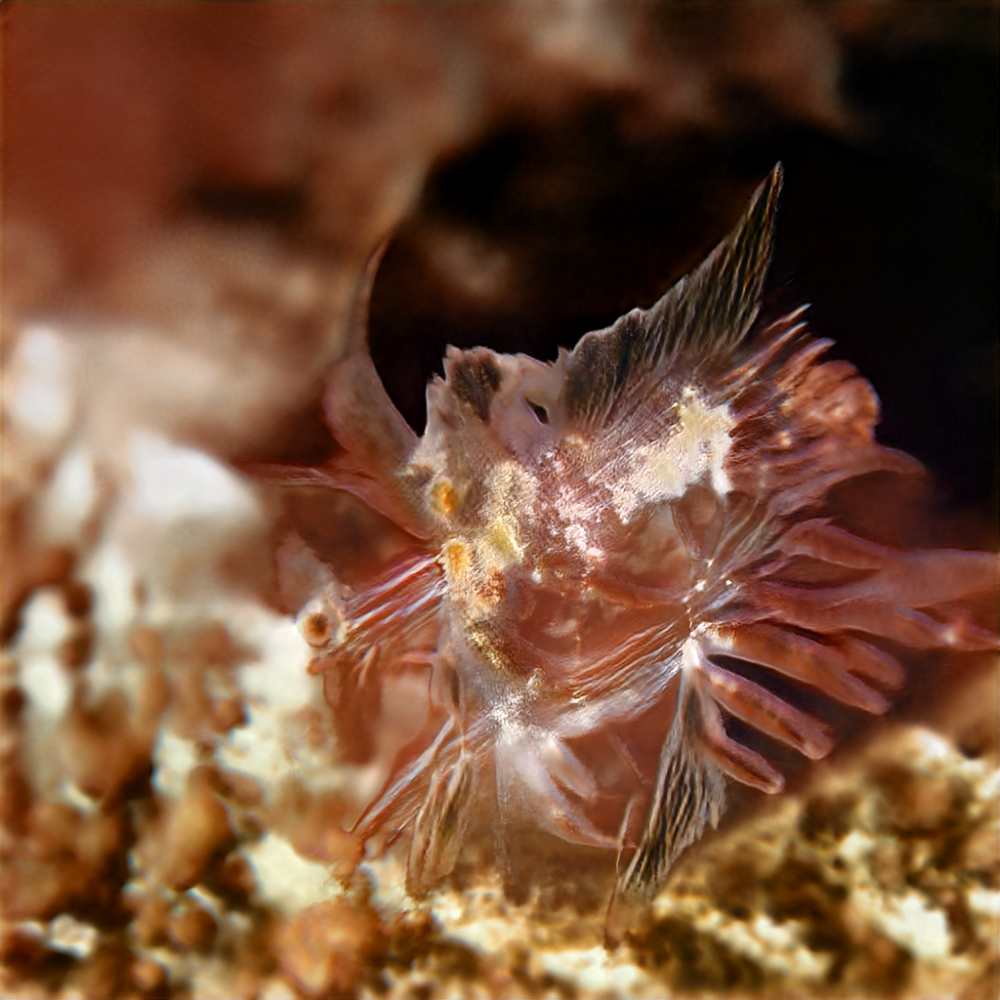

In [ ]:
gen_img(seed_to_w(4))

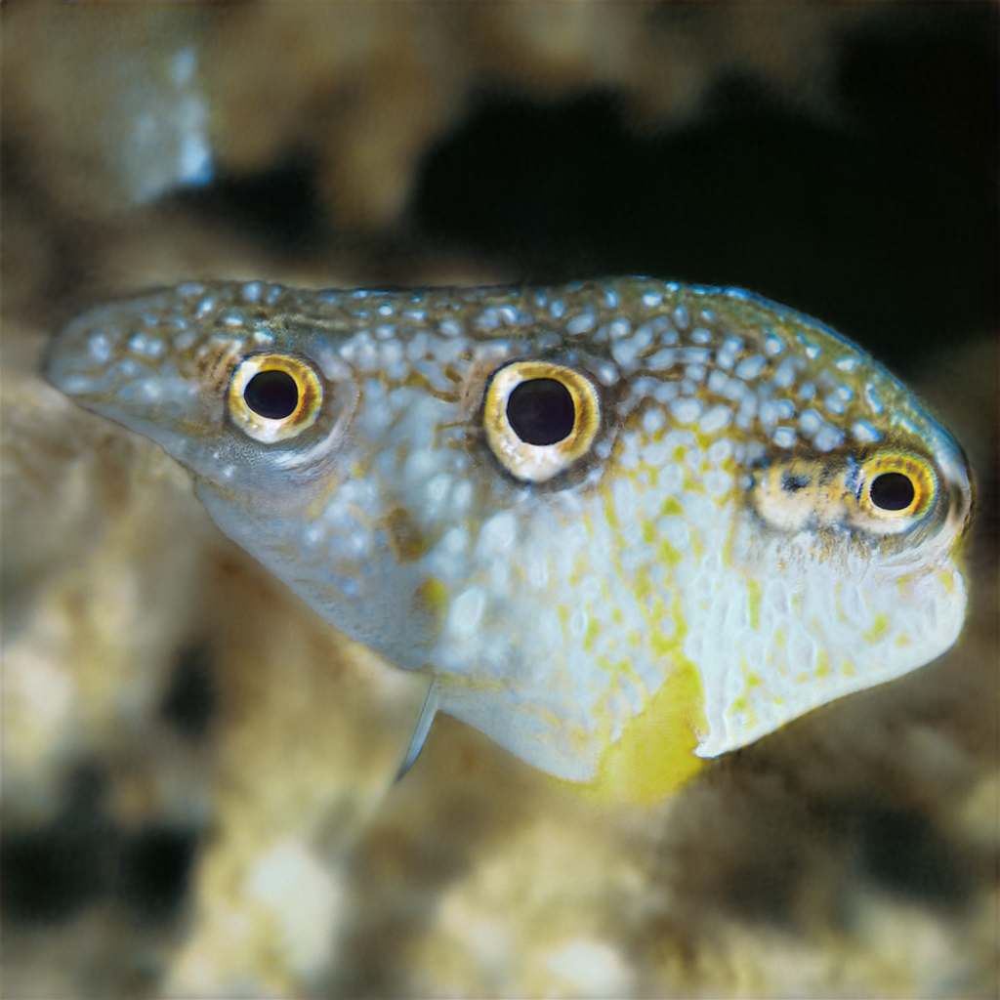

In [ ]:
gen_img(seed_to_w(50))

In [ ]:
gen_img(seed_to_w(60))

Output hidden; open in https://colab.research.google.com to view.

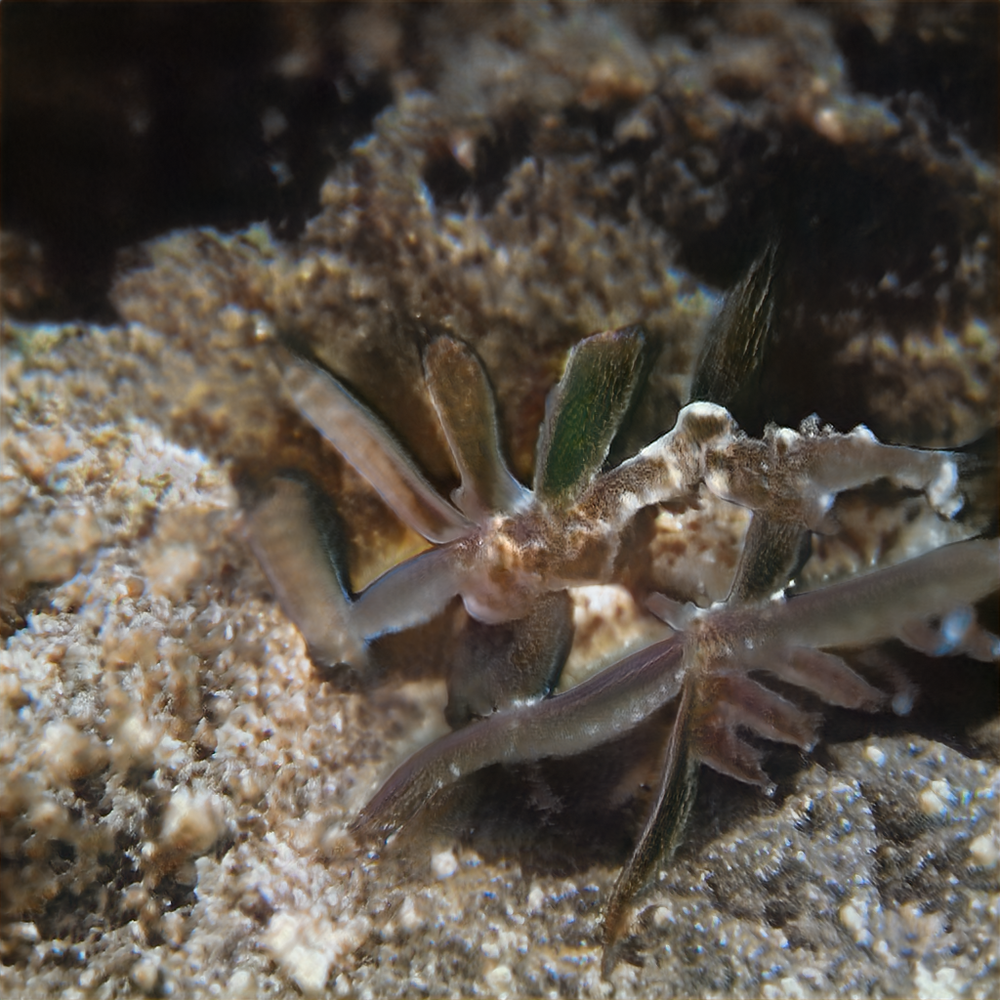

In [ ]:
gen_img(seed_to_w(90))

## Generate 100 seed images
Run following code to generate an image for each seed number. This will give you a good overview what your model can generate. You can write down the most interesting seed numbers for later usage. 

In [ ]:
display_sequence([
    seed_to_w(i, 0.5)
    for i in range(1000)
]);


interactive(children=(IntSlider(value=0, description='frame', max=999), Output()), _dom_classes=('widget-inter…

## Save images to folder
Change the output folder to your google drive folder if you want to view more images at once. Increase number of images to generate more seeds.

In [ ]:
output_dir = '/content/drive/MyDrive/MachineLearning/stylegan-out/MarineBiologyGeneration_II'  #@param {type: "string"}
num_images = 100   #@param {type: "number"}

os.makedirs(output_dir, exist_ok=True)
for i in tqdm(range(num_images)):
    fname = os.path.join(output_dir, f"seed_{i}.jpg")
    gen_img(seed_to_w(i, 0.5)).save(fname)

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.



# Principal Components
Principal Component Analysis is a technique to find the most uncorrelated features in a dataset. For our model generation, if we change a number in our latent vectors it will change many things at once. The head rotation, background and many details. Using PCA we can find isolated vectors, so called Eigenvectors, which will change only one feature, like smiling or head rotation.

We need to define a base image to play around with. We just take the average image by setting truncation psi to zero. You can also use other seeds of course, but you need to set truncation_psi to somewhere between 0.0 and 1.0. 

In [ ]:
# Change this seed number for the viewer below!!
seed_number = 10


# We analyse 1000 random images
ws = [seed_to_w(i).flatten() for i in tqdm(range(1000))]
ws = np.stack(ws)

pca = PCA(10)
pca.fit(ws)

# This is the start image for the image viewer below
base_w = seed_to_w(seed_number, truncation_psi=1.0)

components = [
    torch.tensor(comp).reshape(G.num_ws, G.w_dim)
    for comp in pca.components_
]

sliders = [
    widgets.FloatSlider(0, min=-100, max=100, description=f"comp{i}")
    for i in range(len(components))
]


min_layer = widgets.IntSlider(0, min=0, max=G.num_ws, description=f"min layer")
max_layer = widgets.IntSlider(G.num_ws, min=0, max=G.num_ws, description=f"max layer")

sliders += [min_layer, max_layer]

def to_png(img):
    img_byte_arr = io.BytesIO()
    img.save(img_byte_arr, format='PNG')
    return img_byte_arr.getvalue()

def render_image():
    x = base_w.clone()
    for i in range(min_layer.value, max_layer.value):
        for c, s in zip(components, sliders):
            x[i] += x[i] * c[i] * s.value
    return to_png(gen_img(x))


def on_change(w):
    image.value = render_image()

    
for s in sliders:
    s.observe(on_change, names='value')

image = widgets.Image(
    layout=widgets.Layout(width='1024px', height='1024px'),
    value=render_image())

display(
    widgets.Box([
        widgets.VBox(sliders),
        image
    ]),
)

Box(children=(VBox(children=(FloatSlider(value=0.0, description='comp0', min=-100.0), FloatSlider(value=0.0, d…

## Video
A latent walk is a smooth transition between key images you can define. 

In [ ]:
class Video:
    def __init__(self, fps, pca=None):
        self.fps = fps
        self.keyframes = {}
        self.motions = []
        if pca:
            self.components = [
                torch.tensor(comp).reshape(G.num_ws, G.w_dim)
                for comp in pca.components_
            ]
        
    def add_motion(self, component, motion, react=1, layers=None):
        if layers is None:
            layers = slice(0, G.num_ws)
            
        frames = self.components[component] * motion.view(-1, 1, 1) * react
        
        self.motions.append({
            'frames': frames,
            'layers': layers
        })

    def add_seed(self, time, seed, interpolate=True):
        self.keyframes[time] = {'seed': seed, 'interpolate': interpolate}

    def add_z(self, time, z, interpolate=True):
        self.keyframes[time] = {'z': z, 'interpolate': interpolate}

    def add_w(self, time, w, interpolate=True):
        self.keyframes[time] = {'w': w, 'interpolate': interpolate}

    def get_frames(self):
        current_time = 0
        last_w = None
        last_t = None
        frames = []
        for current_t, frame in sorted(self.keyframes.items()):
            if 'seed' in frame:
                current_w = seed_to_w(frame['seed'])
            elif 'z' in frame:
                current_w = z_to_w(frame['z'])
            elif 'w' in frame:
                current_w = frame['w']
            if last_w is not None:
                num_frames = int((current_t - last_t) * self.fps)
                if frame['interpolate']:
                    frames.extend(interpolate_w(last_w, current_w, num_frames))
                else:
                    frames.extend(interpolate_w(last_w, last_w, num_frames - 1))
                    frames.append(current_w)
            last_w = current_w
            last_t = current_t
        frames = torch.stack(frames)
        for motion in self.motions:
            layers = motion['layers']
            mframes = motion['frames']
            for i in range(frames.size(0)):
                if i < mframes.size(0):
                    frames[i, layers] *= (1 + mframes[i, layers])
        return frames

    def render(self, fname, truncation_psi=0.8):
        video = imageio.get_writer(fname)
        for frame in self.get_frames():
            video.append_data(gen(frame)[0].cpu.numpy())
        video.close()
    
    def show(self):
        display_sequence(self.get_frames())


In [ ]:
# lets create a video with one frame per second to demo
v = Video(fps=1)

# this is the start image
v.add_seed(time=0.0, seed=90)

# now we're morphing to another seed image
v.add_seed(time=10.0, seed=60)

# now we want to switch suddenly to seed 50 without morphing
v.add_seed(time=20.0, seed=50, interpolate=False)

# morph to the last image
v.add_seed(time=30.0, seed=1)
v.show()

In [ ]:
# This will render the video as file
v.render('video_seeds.mp4')

AttributeError: ignored

In the next video we will use the projected vector from our upload to morph from another seed image.

In [ ]:
v = Video(fps=10)
v.add_w(time=0.0, w=initial_img[99])
v.add_w(time=20.0, w=target1[999])
v.show()

interactive(children=(IntSlider(value=0, description='frame', max=199), Output()), _dom_classes=('widget-inter…

In [ ]:
# This will render the video as file
v.render('video_seed_uploaded.mp4')

RuntimeError: ignored

# Audio Reactive

How to create a video:

1. Load your network, change pkl file above
2. Look at all seed images from 1-100 or more and write down the interesting ones
3. Upload your audio track to GDrive and change the song variable below
4. Decide which parts of the song get what seed numbers
5. Add the seed numbers and timings to the video code below, (v.add_seed ..) and render a video to see how it works 
6. Run PCA and play around with the components and layers, in combination with the seeds
7. Decide on which component should react to the video
8. Add the motions using the sample code below, (v.add_motion ...)
9. Fine tune the motions with layers, e.g. layers 0-6 for shapes and 9-18 for colors and patterns
10. Add as many motions as you like, e.g. the harmonic motion could change many different components and layers
11. Copy paste the video code cell to experiment with multiple versions of the video

In [ ]:
# DOWNLOADING EXAMPLE AUDIO

## CHEMICAL LOVE - BASICALLY SATURDAY NIGHT ## 
! gdown --id 1aTWrzCvJyYcQ82PS6av3YJrtsON2_CUK

## PANCAKE FEET - TENNYSSON ## 
! gdown --id 14MqCkuREr1TmuWaxZd8bnuhVlL_vCE9s

Downloading...
From: https://drive.google.com/uc?id=1aTWrzCvJyYcQ82PS6av3YJrtsON2_CUK
To: /home/mm/notebooks/chemical_love.wav
15.9MB [00:00, 26.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=14MqCkuREr1TmuWaxZd8bnuhVlL_vCE9s
To: /home/mm/notebooks/pancake_feet.mp3
100%|████████████████████████████████████████| 961k/961k [00:00<00:00, 6.52MB/s]


In [ ]:
from librosa.feature import melspectrogram

# Change this to your audio file on GDrive (copy path from browser on the lef)
song = "/content/drive/MyDrive/MachineLearning/Audio/MLSoundtrack_1.wav"

# Only work on part of the audio file to reduce rendering times
# start in seconds
start = 0
# how many seconds of the audio file
duration = 37

# frames per second, I would use 10 for testing and the final video at least 30fps
fps = 30
input_shape = 512

# Load audio signal data
wav, sr = librosa.load(song, offset=start, duration=duration)
wav_harm, wav_perc = librosa.effects.hpss(wav)

# Calculate frame duration (i.e. samples per frame)
frame_duration = int(sr/fps - (sr/fps % 64))

spec_all = melspectrogram(wav, sr, hop_length=frame_duration, n_mels=input_shape)
spec_harm = melspectrogram(wav_harm, sr, hop_length=frame_duration, n_mels=input_shape)
spec_perc = melspectrogram(wav_perc, sr, hop_length=frame_duration, n_mels=input_shape)

motion_harm = smooth_normalize(spec_harm)
motion_perc = smooth_normalize(spec_perc)
motion_top = smooth_normalize(spec_perc[256:,:])

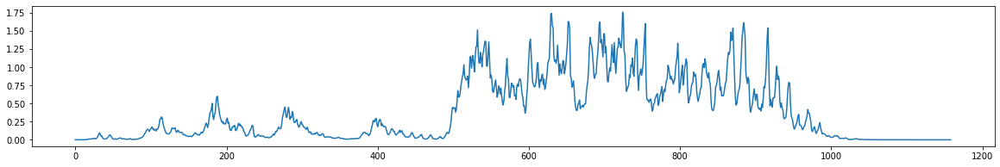

In [31]:
# Motion for percussive elements, e.g. drums
plt.figure(figsize=(20, 3))
plt.plot(np.arange(motion_perc.shape[0]), motion_top)

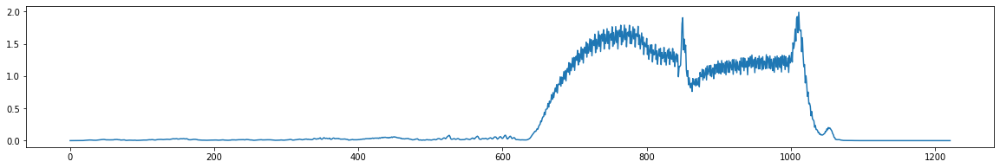

In [ ]:
# Motion of harmonic changes 
plt.figure(figsize=(20, 3))
plt.plot(np.arange(motion_harm.shape[0]), motion_harm)

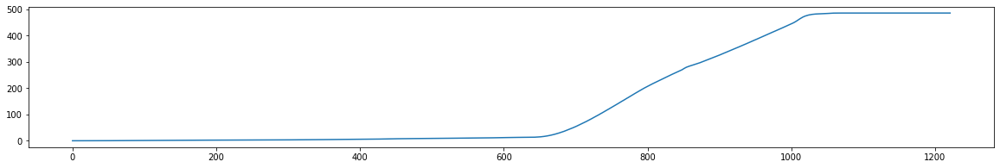

In [ ]:
# Harmonic changes as cumulative sum, e.g. adding up changes over time
plt.figure(figsize=(20, 3))
plt.plot(np.arange(motion_harm.shape[0]), motion_harm.cumsum(0))

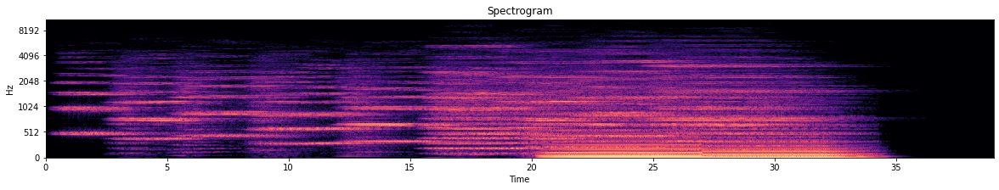

In [ ]:
plt.figure(figsize=(20, 3))
plt.title('Spectrogram')
librosa.display.specshow(librosa.power_to_db(spec_all, ref=np.max),
                         hop_length=frame_duration,
                         x_axis='time', y_axis='mel');

In [ ]:
Audio(wav, rate=sr)

In [ ]:
# This is the code to generate your final video with audio track

v = Video(fps, pca)

v.add_seed(time=0.0, seed=55)
v.add_seed(time=17.0, seed=53)

# final frame always needed
v.add_seed(time=35.0, seed=97)

# Connecting the harmonic motion
v.add_motion(
    component=1,  # the first component, as seen from the PCA component viewer above
    motion=motion_harm,  # connecting the harmonics
    react=-20,  # how much the slider reacts to the music, negative value to make the slider go left
    layers=slice(16, 18)  # First 8 layers for the changing shapes but not colors
)

# Connecting the percussive motion
v.add_motion(
    component=7,  # the component number 8 as seen from the viewer
    motion=motion_harm.cumsum(0),   # connecting to the percussive motion from the audio
    react=-0.2,
    layers=slice(9, 7)   # changing only colors and structure
)

v.add_motion(
     component=3,
     motion=motion_harm.cumsum(0),
     react=0.1,
     layers=slice(12, 13)
)
v.add_motion(
    component=6,
    motion=motion_top,
    layers=slice(8,12),
    react=-30
)
v.add_motion(
    component=0,
    motion=motion_perc,
    react=50,
    layers=slice(6,12)
)
v.add_motion(
    component=4,
    motion=motion_perc,
    layers=slice(5,8),
    react=-15
)

render_file('out.mp4', v.get_frames(), wav, sr)


[MoviePy] >>>> Building video out.mp4
[MoviePy] Writing audio in outTEMP_MPY_wvf_snd.mp4


100%|██████████| 816/816 [00:01<00:00, 600.65it/s]

[MoviePy] Done.
[MoviePy] Writing video out.mp4



100%|██████████| 1051/1051 [00:37<00:00, 28.40it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: out.mp4 



In [ ]:
img_trg1 = upload_img()
img_trg2 = upload_img()
img_trg3 = upload_img()
img_trg4 = upload_img()
img_trg5 = upload_img()
img_trg6 = upload_img()
img_trg7 = upload_img()
img_trg8 = upload_img()
img_trg9 = upload_img()
img_inic = upload_img()

Saving Target_1.png to Target_1 (1).png


Saving Target_2.png to Target_2 (1).png


Saving Target_3.png to Target_3 (1).png


Saving Target_4.png to Target_4.png


Saving Target_5.png to Target_5.png


Saving Target_6.png to Target_6.png


Saving Target_7.png to Target_7.png


Saving Target_8.png to Target_8.png


Saving Target_9.png to Target_9.png


Saving Inicial.png to Inicial.png


In [ ]:
initial_img = projector.project(G, img_inic, num_steps=100, device='cuda')
target1 = projector.project(G, img_trg1, num_steps=1000, device='cuda' ) 
target2 = projector.project(G, img_trg2, num_steps=1000, device='cuda' )
target3 = projector.project(G, img_trg3, num_steps=1000, device='cuda' )
target4 = projector.project(G, img_trg4, num_steps=1000, device='cuda' )
target5 = projector.project(G, img_trg5, num_steps=1000, device='cuda' )
target6 = projector.project(G, img_trg6, num_steps=1000, device='cuda' )
target7 = projector.project(G, img_trg7, num_steps=1000, device='cuda' )
target8 = projector.project(G, img_trg8, num_steps=1000, device='cuda' )
target9 = projector.project(G, img_trg9, num_steps=1000, device='cuda' )

In [ ]:
initial_img = projector.project(G, img_inic, num_steps=100, device='cuda:0')

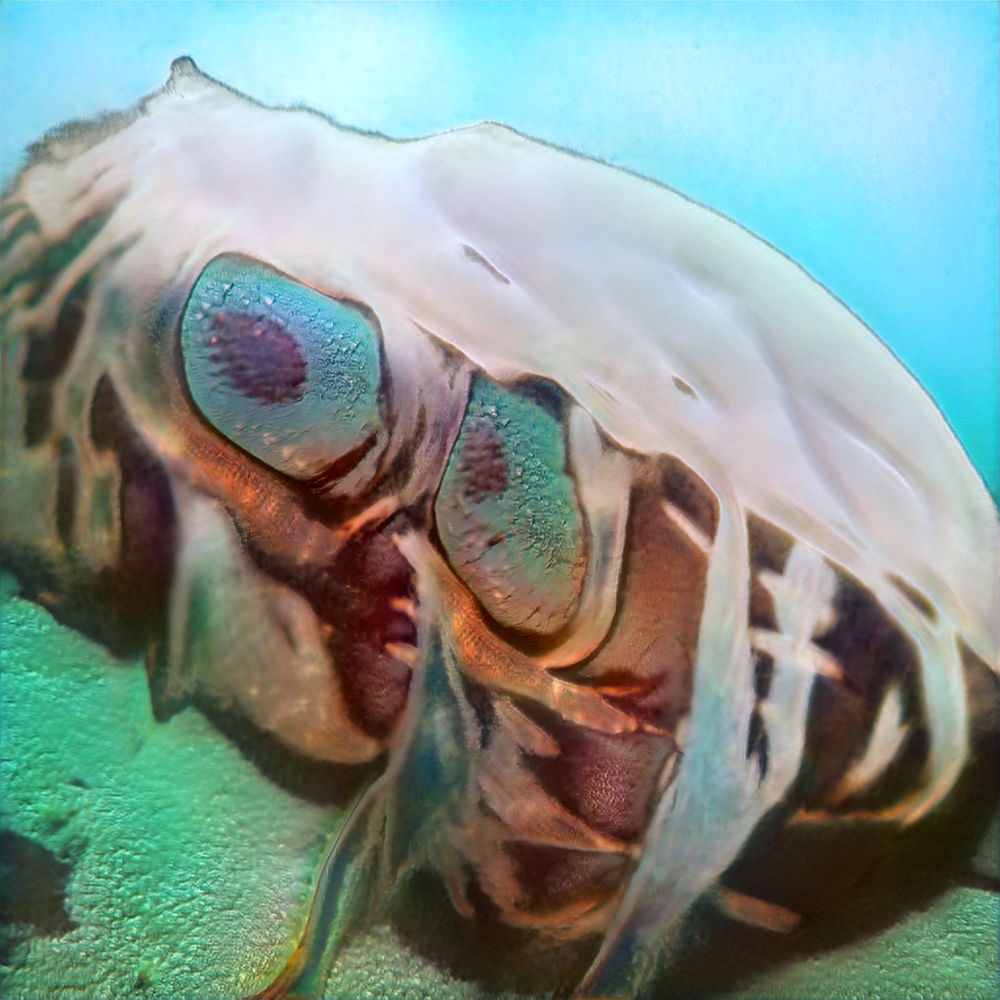

In [ ]:
gen_img(target1[999])

In [ ]:
# New video generation using w
v = Video(fps, pca)

# first and last frames
v.add_seed(time=0.0, seed=1)
v.add_seed(time=39.0, seed=60)

# Connecting the harmonic motion
v.add_motion(
    component=3,  # the first component, as seen from the PCA component viewer above
    motion=motion_harm,  # connecting the harmonics
    react=25,  # how much the slider reacts to the music, negative value to make the slider go left
    layers=slice(9, 18)  # First 8 layers for the changing shapes but not colors
)
render_file('out.mp4', v.get_frames(), wav, sr)


[MoviePy] >>>> Building video out.mp4
[MoviePy] Writing audio in outTEMP_MPY_wvf_snd.mp4


100%|██████████| 860/860 [00:01<00:00, 649.60it/s]

[MoviePy] Done.
[MoviePy] Writing video out.mp4



100%|██████████| 1171/1171 [00:56<00:00, 20.58it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: out.mp4 



TypeError: ignored

RuntimeError: ignored